#### Laboratorium 8 - zadania

Przeczytaj treść całej instrukcji przed przystąpieniem do działania!

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#### Zadanie 1 (2.0 pkt | 1.0 pkt)

Dane są obrazy `coke` i `table`. Wykorzystaj metodologię parowania punktów kluczowych do znalezienia wystąpienia puszki z Colą na stole. To zadanie jest podzielone na kilka kamieni milowych - czytaj dalej.

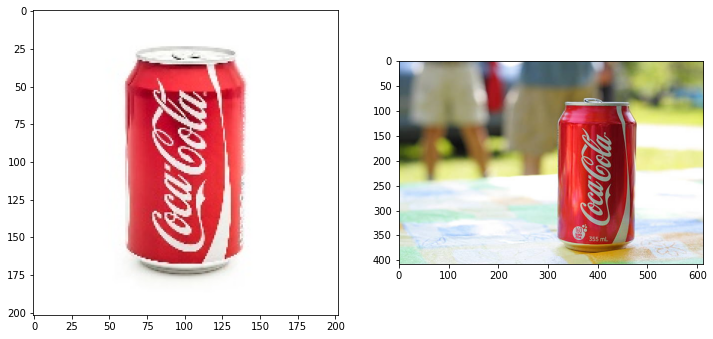

In [2]:
coke = cv2.imread('coke.jpg')
table = cv2.imread('coke-table.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(12,12))
a1.imshow(coke[..., ::-1]);
a2.imshow(table[..., ::-1]);

##### Zadanie 1a (0.25 pkt | 0.25 pkt)

Wykonaj detekcję punktów kluczowych i ich parowanie z użyciem dowolnego matchera. Wykonaj filtrację znalezionych par po dystansie - co obserwujesz, zmieniając próg?

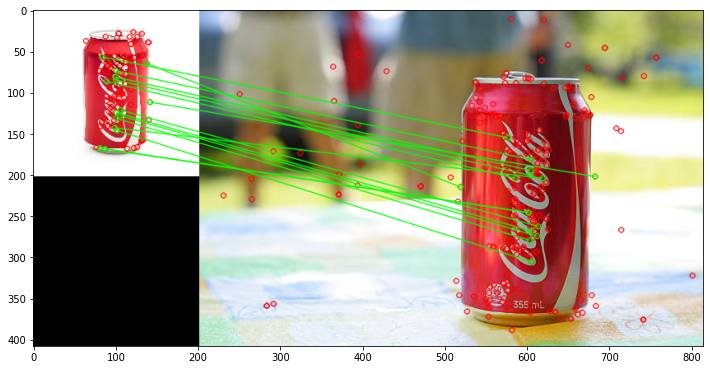

In [16]:
sift = cv2.SIFT_create(contrastThreshold=0.05)
kp1, ds1 = sift.detectAndCompute(coke, mask=None)
kp2, ds2 = sift.detectAndCompute(table, mask=None)

matcher = cv2.BFMatcher_create()
best_matches = matcher.match(ds1, ds2)

filtered_matches = list(filter(lambda x: x.distance < 200, best_matches))

show_matches = cv2.drawMatches(coke, kp1, table, kp2, filtered_matches, None, matchColor=(0,255,0), singlePointColor=(0,0,255))
plt.subplots(1, 1, figsize=(12,12))[1].imshow(show_matches[...,::-1]);

##### Zadanie 1b (0.25 pkt | 0.25 pkt)

Powtórz detekcję z użyciem k-najlepszych wyników (dla niewielkiego k, np. 2 lub 3). Zaproponuj prosty sposób wykrywania sytuacji, w których jeden punkt jest podobnie bliski innym i użyj go do odfiltrowania wyników, tak aby pozostawić te bardziej unikatowe dopasowania. *Czy unikatowe znaczy dobre?*

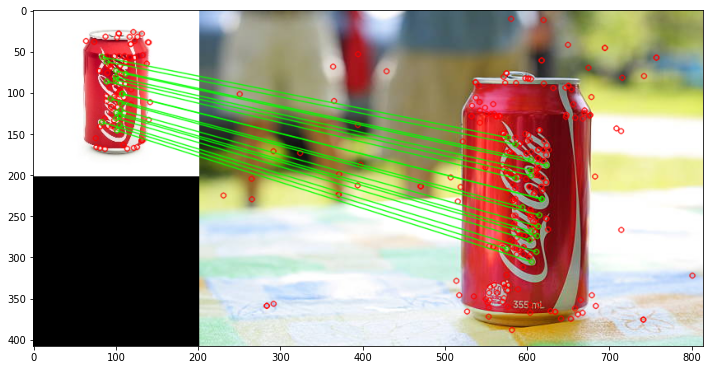

In [57]:
THRESHOLD = 100

sift = cv2.SIFT_create(contrastThreshold=0.05)
kp1, ds1 = sift.detectAndCompute(coke, mask=None)
kp2, ds2 = sift.detectAndCompute(table, mask=None)

matcher = cv2.BFMatcher_create()
best_k_matches = matcher.knnMatch(ds1, ds2, k=3)

best_matches = []
for matches in best_k_matches:
    dists = [match.distance for match in matches]
    order = np.argsort(dists)
    if dists[order[1]] - dists[order[0]] > THRESHOLD:
        best_matches.append(matches[order[0]])

show_matches = cv2.drawMatches(coke, kp1, table, kp2, best_matches, None, matchColor=(0,255,0), singlePointColor=(0,0,255))
plt.subplots(1, 1, figsize=(12,12))[1].imshow(show_matches[...,::-1]);

##### Zadanie 1c (0.5 pkt | 0.5 pkt)

Znajdź transformację geometryczną dla par dopasowanych punktów, tak aby przekształcić `coke` (*train*) do geometrii `table` (query). Zademonstruj poprawność, zestawiając obok siebie przekształconą wersję `coke` oraz oryginalny `table`, bądź nanosząc jedno na drugie. Zidentyfikuj punkty, które znaleziona transformacja przekształca "dobrze", tzn. ich współrzędne po przekształceniu leżą w pobliżu odpowiadających im punktów z drugiego obrazu; nanieś je na obraz.

*Jak na wyniki wpływa wykrycie większej lub mniejszej liczby punktów kluczowych na etapie SIFT? W jakim stopniu wstępna filtracja poprawia rezultaty?*

*Jeśli starczy czasu:* znajdź rejon zainteresowania (RoI), tj. prostokąt otaczający zidentyfikowane właśnie punkty, a następnie oblicz błąd średniokwadratowy między obrazami w tym rejonie (albo dowolną miarę podobieństwa). Bonus: użyj [`cv2.convexHull`](https://docs.opencv.org/4.x/d3/dc0/group__imgproc__shape.html#ga014b28e56cb8854c0de4a211cb2be656) do narysowania maski wybierającej tylko piksele znajdujące się wewnątrz wielokąta otaczającego "dobrze" dopasowane punkty, by liczyć miarę podobieństwa jedynie wewnątrz tego obszaru.

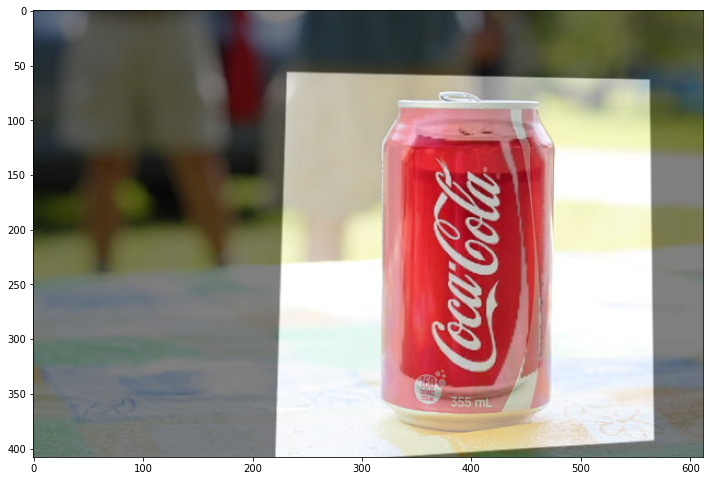

In [58]:
srcPoints = np.array([kp1[match.queryIdx].pt for match in best_matches])
dstPoints = np.array([kp2[match.trainIdx].pt for match in best_matches])
retval, mask = cv2.findHomography(srcPoints, dstPoints)
img = cv2.warpPerspective(coke, retval, table.shape[:2][::-1])
mixed = cv2.addWeighted(img, 0.5, table, 0.5, 0)
fig, ax = plt.subplots(1, 1, figsize=(12,12))
ax.imshow(mixed[...,::-1]);

#### Zadanie 2 (1 pkt | 1 pkt)

Powtórz eksperymenty dla obrazów `k7`, `detail` i `fine`, traktując `k7` jako *query* (tj. szukając weń wystąpień tamtych). **Co jest przyczyną trudności?**

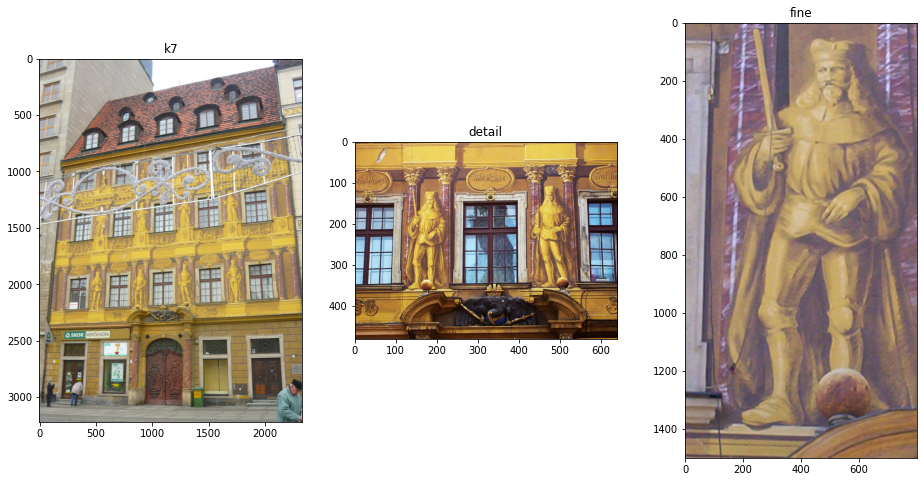

In [4]:
k7 = cv2.imread('kp7e.jpg')
detail = cv2.imread('kp7e_detail.jpg')
fine = cv2.imread('kp7e_fine.jpg')
f, (a1, a2, a3) = plt.subplots(1, 3, figsize=(16,8))
a1.imshow(k7[..., ::-1]);
a1.set_title('k7');
a2.imshow(detail[..., ::-1]);
a2.set_title('detail');
a3.imshow(fine[..., ::-1]);
a3.set_title('fine');

In [69]:
def single_match(query, train, threshold=200):
    sift = cv2.SIFT_create(contrastThreshold=0.05)
    kp1, ds1 = sift.detectAndCompute(query, mask=None)
    kp2, ds2 = sift.detectAndCompute(train, mask=None)

    matcher = cv2.BFMatcher_create()
    best_matches = matcher.match(ds1, ds2)

    filtered_matches = list(filter(lambda x: x.distance < threshold, best_matches))

    show_matches = cv2.drawMatches(query, kp1, train, kp2, filtered_matches, None, matchColor=(0,255,0), singlePointColor=(0,0,255))
    plt.subplots(1, 1, figsize=(12,12))[1].imshow(show_matches[...,::-1]);

def multi_match(query, train, threshold=100):
    sift = cv2.SIFT_create(contrastThreshold=0.05)
    kp1, ds1 = sift.detectAndCompute(query, mask=None)
    kp2, ds2 = sift.detectAndCompute(train, mask=None)

    matcher = cv2.BFMatcher_create()
    best_k_matches = matcher.knnMatch(ds1, ds2, k=3)

    best_matches = []
    for matches in best_k_matches:
        dists = [match.distance for match in matches]
        order = np.argsort(dists)
        if dists[order[1]] - dists[order[0]] > threshold:
            best_matches.append(matches[order[0]])

    show_matches = cv2.drawMatches(query, kp1, train, kp2, best_matches, None, matchColor=(0,255,0), singlePointColor=(0,0,255))
    plt.subplots(1, 1, figsize=(12,12))[1].imshow(show_matches[...,::-1]);

def overlay(query, train, threshold=100):
    sift = cv2.SIFT_create(contrastThreshold=0.05)
    kp1, ds1 = sift.detectAndCompute(query, mask=None)
    kp2, ds2 = sift.detectAndCompute(train, mask=None)

    matcher = cv2.BFMatcher_create()
    best_k_matches = matcher.knnMatch(ds1, ds2, k=3)

    best_matches = []
    for matches in best_k_matches:
        dists = [match.distance for match in matches]
        order = np.argsort(dists)
        if dists[order[1]] - dists[order[0]] > threshold:
            best_matches.append(matches[order[0]])

    srcPoints = np.array([kp1[match.queryIdx].pt for match in best_matches])
    dstPoints = np.array([kp2[match.trainIdx].pt for match in best_matches])
    retval, mask = cv2.findHomography(srcPoints, dstPoints)
    img = cv2.warpPerspective(query, retval, train.shape[:2][::-1])
    mixed = cv2.addWeighted(img, 0.5, train, 0.5, 0)
    fig, ax = plt.subplots(1, 1, figsize=(12,12))
    ax.imshow(mixed[...,::-1]);

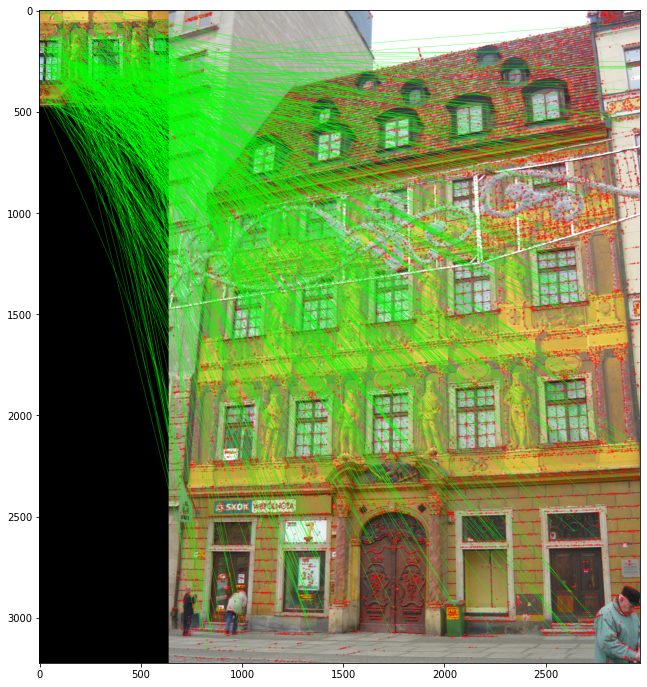

In [70]:
single_match(detail, k7)

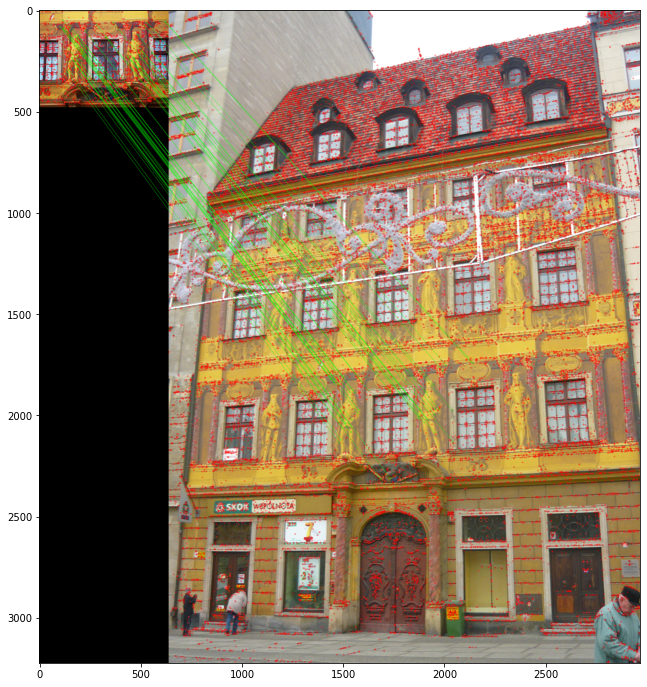

In [81]:
multi_match(detail, k7, threshold=120)

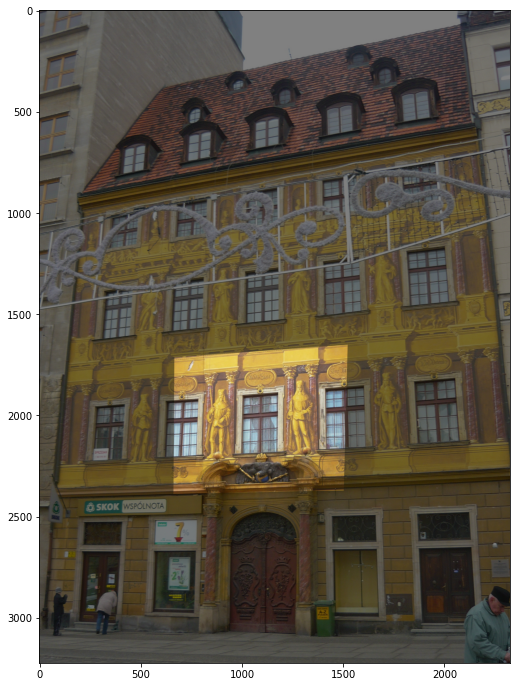

In [80]:
overlay(detail, k7, threshold=120)

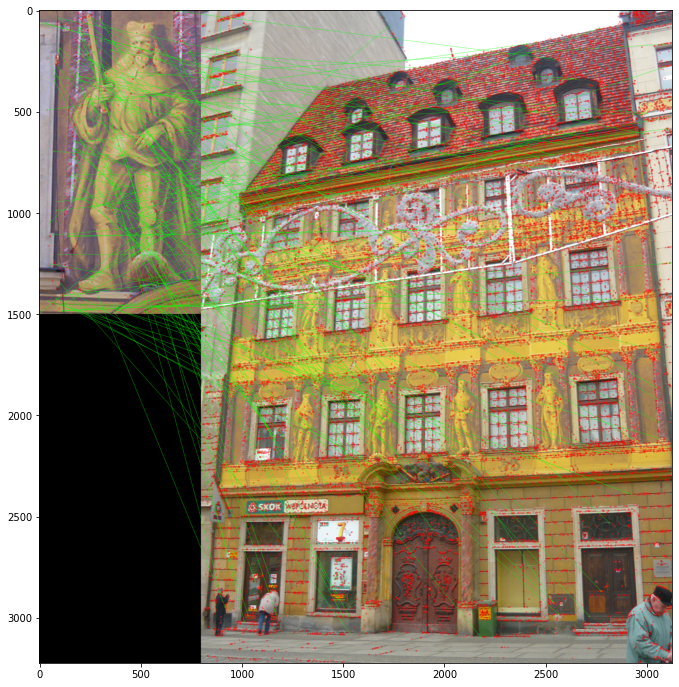

In [73]:
single_match(fine, k7)

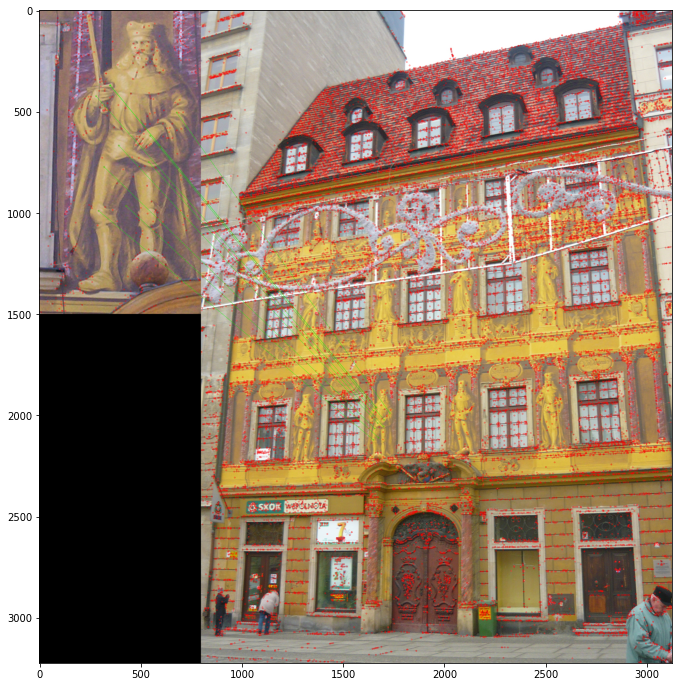

In [76]:
multi_match(fine, k7)

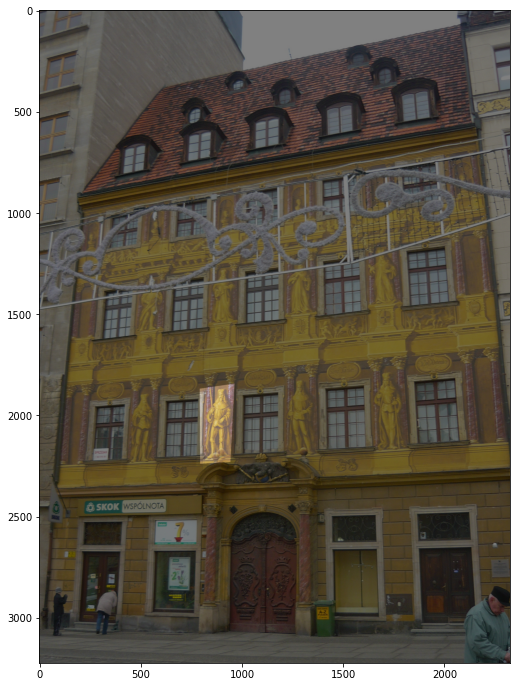

In [77]:
overlay(fine, k7)

*Jeśli starczy czasu*: uwzględnij również obraz `side`.

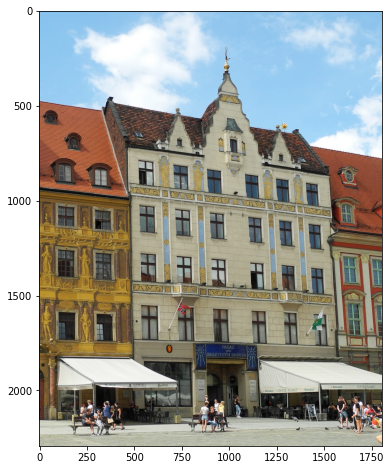

In [5]:
side = cv2.imread('kp7e_side.jpg')
plt.subplots(1, 1, figsize=(8,8))[1].imshow(side[..., ::-1]);

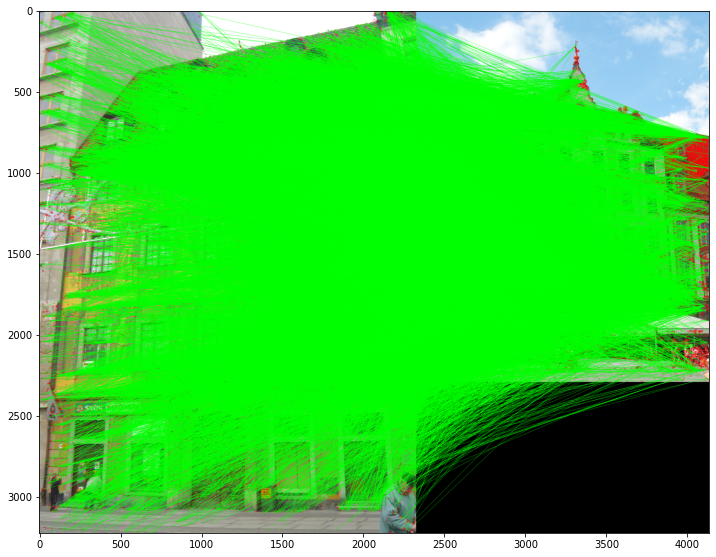

In [85]:
single_match(k7, side)

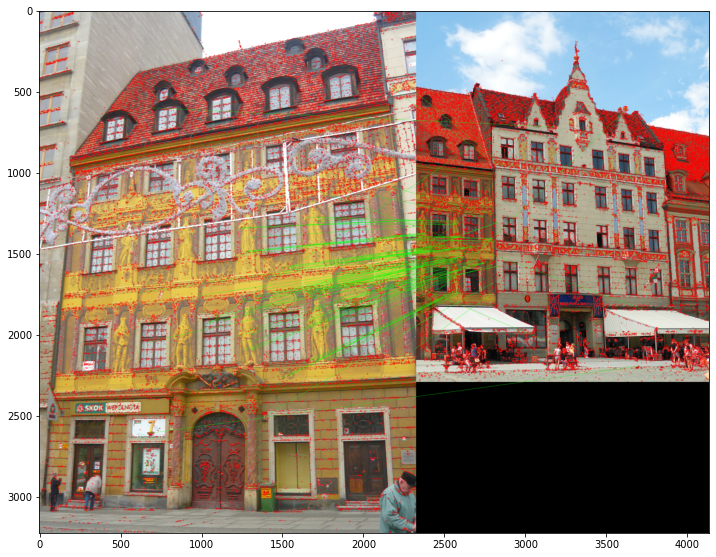

In [86]:
multi_match(k7, side)

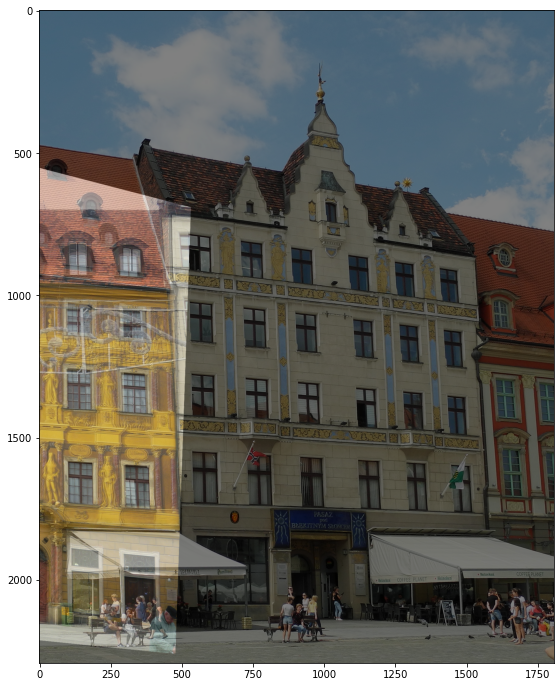

In [90]:
overlay(k7, side, threshold=150)